In [4]:
import matplotlib
matplotlib.use('Agg')

import datetime
import os
import sys
import glob
import yaml
import math
import numpy as np
from tqdm import tqdm

import matplotlib.pyplot as plt
%matplotlib inline

params = {
   'axes.labelsize': 14,
   'font.size': 14,
   'font.family': 'Roboto',
   'legend.fontsize': 20,
   'xtick.labelsize': 20,
   'ytick.labelsize': 20,
   'axes.labelsize': 25,
   'axes.titlesize': 25,
   'text.usetex': False,
   'figure.figsize': [12, 12]
}
matplotlib.rcParams.update(params)

import seaborn as sns
import pandas as pd

import ase
from ase.io.trajectory import Trajectory

In [174]:
temp_dir = "temp/"
videos_dir = "videos/"

config = {
    "num_procs": 1,
    "fps": 30,
}

## Viewing a trajectory

In [ ]:
from nglview import show_ase, show_asetraj

identifier = "COCu_lang_2ps_300K.traj"
traj = Trajectory("data/%s" % identifier)

trajview = show_asetraj(traj[:100])
trajview

## Saving a trajectory video

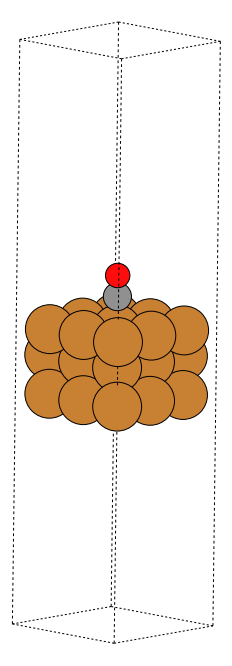

In [25]:
# identifier = "COCu_lang_2ps_300K.traj"
identifier = "COCu_DFT_10ps.traj"
traj = Trajectory("data/%s" % identifier)

# fig, ax = plt.subplots()
# ax.axis("off")
# ase.visualize.plot.plot_atoms(traj[0], ax, radii=0.8, rotation=("-75x, 45y, 10z"))

ase.io.write(os.path.join(videos_dir, identifier + ".mp4"),
             [traj[i] for i in range(0, len(traj), 50)],
             interval=5,
             rotation=("-75x, 45y, 10z"))

## Molecular dynamics

Following the tutorial here: https://wiki.fysik.dtu.dk/ase/tutorials/md/md.html

In [36]:
"""Demonstrates molecular dynamics with constant energy."""

from ase.lattice.cubic import FaceCenteredCubic
from ase.md.velocitydistribution import MaxwellBoltzmannDistribution
from ase.md.verlet import VelocityVerlet
from ase import units

# Use Asap for a huge performance increase if it is installed
use_asap = True

if use_asap:
    from asap3 import EMT
    size = 10
else:
    from ase.calculators.emt import EMT
    size = 3
    
# Set up a crystal
atoms = FaceCenteredCubic(directions=[[1, 0, 0], [0, 1, 0], [0, 0, 1]],
                          symbol='Cu',
                          size=(size, size, size),
                          pbc=True)

# Describe the interatomic interactions with the Effective Medium Theory
atoms.set_calculator(EMT())

# Set the momenta corresponding to T=300K
MaxwellBoltzmannDistribution(atoms, 300 * units.kB)

# We want to run MD with constant energy using the VelocityVerlet algorithm.
dyn = VelocityVerlet(atoms, 5 * units.fs)  # 5 fs time step.


def printenergy(a):
    """Function to print the potential, kinetic and total energy"""
    epot = a.get_potential_energy() / len(a)
    ekin = a.get_kinetic_energy() / len(a)
    print('Energy per atom: Epot = %.3feV  Ekin = %.3feV (T=%3.0fK)  '
          'Etot = %.3feV' % (epot, ekin, ekin / (1.5 * units.kB), epot + ekin))

# Now run the dynamics
printenergy(atoms)
traj = [atoms.copy()]

for i in range(20):
    dyn.run(10)
    printenergy(atoms)
    traj.append(atoms.copy())

Energy per atom: Epot = -0.001eV  Ekin = 0.039eV (T=300K)  Etot = 0.038eV
Energy per atom: Epot = 0.029eV  Ekin = 0.009eV (T= 70K)  Etot = 0.038eV
Energy per atom: Epot = 0.020eV  Ekin = 0.019eV (T=144K)  Etot = 0.038eV
Energy per atom: Epot = 0.018eV  Ekin = 0.021eV (T=160K)  Etot = 0.038eV
Energy per atom: Epot = 0.017eV  Ekin = 0.021eV (T=164K)  Etot = 0.038eV
Energy per atom: Epot = 0.020eV  Ekin = 0.018eV (T=139K)  Etot = 0.038eV
Energy per atom: Epot = 0.020eV  Ekin = 0.019eV (T=146K)  Etot = 0.038eV
Energy per atom: Epot = 0.018eV  Ekin = 0.020eV (T=154K)  Etot = 0.038eV
Energy per atom: Epot = 0.018eV  Ekin = 0.021eV (T=160K)  Etot = 0.038eV
Energy per atom: Epot = 0.020eV  Ekin = 0.018eV (T=141K)  Etot = 0.038eV
Energy per atom: Epot = 0.019eV  Ekin = 0.019eV (T=150K)  Etot = 0.038eV
Energy per atom: Epot = 0.019eV  Ekin = 0.020eV (T=153K)  Etot = 0.038eV
Energy per atom: Epot = 0.019eV  Ekin = 0.020eV (T=151K)  Etot = 0.038eV
Energy per atom: Epot = 0.019eV  Ekin = 0.019eV (T

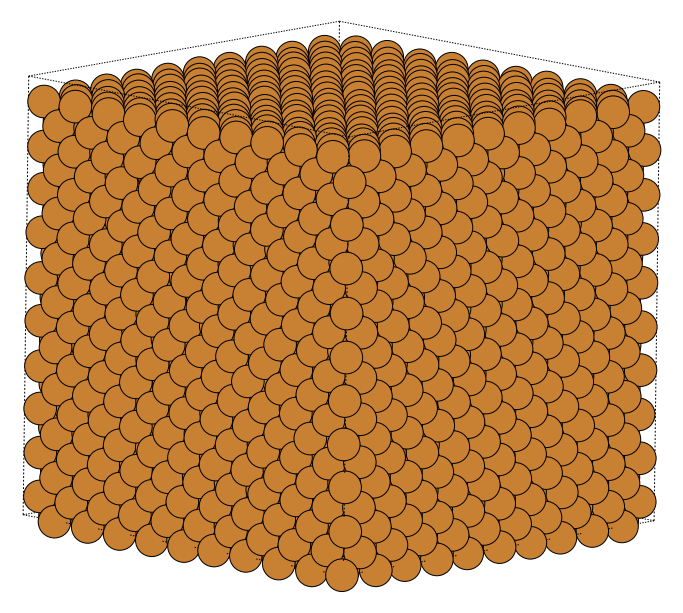

In [37]:
ase.io.write(os.path.join(videos_dir, "Cu_crystal_EMT_velocityverlet.mp4"),
             traj,
             interval=5,
             rotation=("-75x, 45y, 10z"))

In [38]:
"""Demonstrates molecular dynamics with constant energy."""

from ase.lattice.cubic import FaceCenteredCubic
from ase.md.velocitydistribution import MaxwellBoltzmannDistribution
from ase.md.verlet import VelocityVerlet
from ase import units

# Use Asap for a huge performance increase if it is installed
use_asap = True

if use_asap:
    from asap3 import EMT
    size = 10
else:
    from ase.calculators.emt import EMT
    size = 3
    
# Set up a crystal
atoms = FaceCenteredCubic(directions=[[1, 0, 0], [0, 1, 0], [0, 0, 1]],
                          symbol="Cu",
                          size=(size, size, size),
                          pbc=True)

# Describe the interatomic interactions with the Effective Medium Theory
atoms.set_calculator(EMT())

# Set the momenta corresponding to T=300K
MaxwellBoltzmannDistribution(atoms, 300 * units.kB)

# We want to run MD with constant energy using the VelocityVerlet algorithm.
dyn = VelocityVerlet(atoms, 5 * units.fs)  # 5 fs time step.


def printenergy(a=atoms):  # store a reference to atoms in the definition.
    """Function to print the potential, kinetic and total energy."""
    epot = a.get_potential_energy() / len(a)
    ekin = a.get_kinetic_energy() / len(a)
    print('Energy per atom: Epot = %.3feV  Ekin = %.3feV (T=%3.0fK)  '
          'Etot = %.3feV' % (epot, ekin, ekin / (1.5 * units.kB), epot + ekin))

# Now run the dynamics
dyn.attach(printenergy, interval=10)
printenergy()
dyn.run(200)

Energy per atom: Epot = -0.001eV  Ekin = 0.039eV (T=299K)  Etot = 0.038eV
Energy per atom: Epot = -0.001eV  Ekin = 0.039eV (T=299K)  Etot = 0.038eV
Energy per atom: Epot = 0.029eV  Ekin = 0.009eV (T= 70K)  Etot = 0.038eV
Energy per atom: Epot = 0.020eV  Ekin = 0.018eV (T=142K)  Etot = 0.038eV
Energy per atom: Epot = 0.017eV  Ekin = 0.021eV (T=160K)  Etot = 0.038eV
Energy per atom: Epot = 0.017eV  Ekin = 0.021eV (T=162K)  Etot = 0.038eV
Energy per atom: Epot = 0.020eV  Ekin = 0.018eV (T=140K)  Etot = 0.038eV
Energy per atom: Epot = 0.019eV  Ekin = 0.019eV (T=145K)  Etot = 0.038eV
Energy per atom: Epot = 0.018eV  Ekin = 0.020eV (T=155K)  Etot = 0.038eV
Energy per atom: Epot = 0.018eV  Ekin = 0.020eV (T=156K)  Etot = 0.038eV
Energy per atom: Epot = 0.020eV  Ekin = 0.019eV (T=144K)  Etot = 0.038eV
Energy per atom: Epot = 0.019eV  Ekin = 0.019eV (T=149K)  Etot = 0.038eV
Energy per atom: Epot = 0.018eV  Ekin = 0.020eV (T=153K)  Etot = 0.038eV
Energy per atom: Epot = 0.019eV  Ekin = 0.019eV (

True

### Constant temperature MD

In [40]:
"""Demonstrates molecular dynamics with constant energy."""

from ase.lattice.cubic import FaceCenteredCubic
from ase.md.velocitydistribution import MaxwellBoltzmannDistribution
from ase.md.langevin import Langevin
from ase import units

# Use Asap for a huge performance increase if it is installed
use_asap = True

if use_asap:
    from asap3 import EMT
    size = 10
else:
    from ase.calculators.emt import EMT
    size = 3
    
# Set up a crystal
atoms = FaceCenteredCubic(directions=[[1, 0, 0], [0, 1, 0], [0, 0, 1]],
                          symbol="Cu",
                          size=(size, size, size),
                          pbc=True)

# Describe the interatomic interactions with the Effective Medium Theory
atoms.set_calculator(EMT())

# Set the momenta corresponding to T=300K
MaxwellBoltzmannDistribution(atoms, 300 * units.kB)

# We want to run MD with constant energy using the VelocityVerlet algorithm.
# dyn = VelocityVerlet(atoms, 5 * units.fs)  # 5 fs time step.
T = 300
dyn = Langevin(atoms, 5 * units.fs, T * units.kB, 0.002)


def printenergy(a=atoms):  # store a reference to atoms in the definition.
    """Function to print the potential, kinetic and total energy."""
    epot = a.get_potential_energy() / len(a)
    ekin = a.get_kinetic_energy() / len(a)
    print('Energy per atom: Epot = %.3feV  Ekin = %.3feV (T=%3.0fK)  '
          'Etot = %.3feV' % (epot, ekin, ekin / (1.5 * units.kB), epot + ekin))

traj = []
def add_to_traj(a=atoms):
    traj.append(atoms.copy())

# Now run the dynamics
dyn.attach(printenergy, interval=10)
dyn.attach(add_to_traj, interval=10)
printenergy()
dyn.run(200)

Energy per atom: Epot = -0.001eV  Ekin = 0.038eV (T=293K)  Etot = 0.037eV
Energy per atom: Epot = -0.001eV  Ekin = 0.038eV (T=293K)  Etot = 0.037eV
Energy per atom: Epot = 0.029eV  Ekin = 0.009eV (T= 70K)  Etot = 0.038eV
Energy per atom: Epot = 0.020eV  Ekin = 0.019eV (T=145K)  Etot = 0.038eV
Energy per atom: Epot = 0.018eV  Ekin = 0.021eV (T=161K)  Etot = 0.039eV
Energy per atom: Epot = 0.017eV  Ekin = 0.022eV (T=167K)  Etot = 0.039eV
Energy per atom: Epot = 0.021eV  Ekin = 0.019eV (T=144K)  Etot = 0.040eV
Energy per atom: Epot = 0.021eV  Ekin = 0.019eV (T=149K)  Etot = 0.040eV
Energy per atom: Epot = 0.019eV  Ekin = 0.021eV (T=162K)  Etot = 0.040eV
Energy per atom: Epot = 0.019eV  Ekin = 0.021eV (T=165K)  Etot = 0.040eV
Energy per atom: Epot = 0.021eV  Ekin = 0.020eV (T=152K)  Etot = 0.041eV
Energy per atom: Epot = 0.020eV  Ekin = 0.021eV (T=163K)  Etot = 0.041eV
Energy per atom: Epot = 0.020eV  Ekin = 0.021eV (T=164K)  Etot = 0.041eV
Energy per atom: Epot = 0.021eV  Ekin = 0.021eV (

True

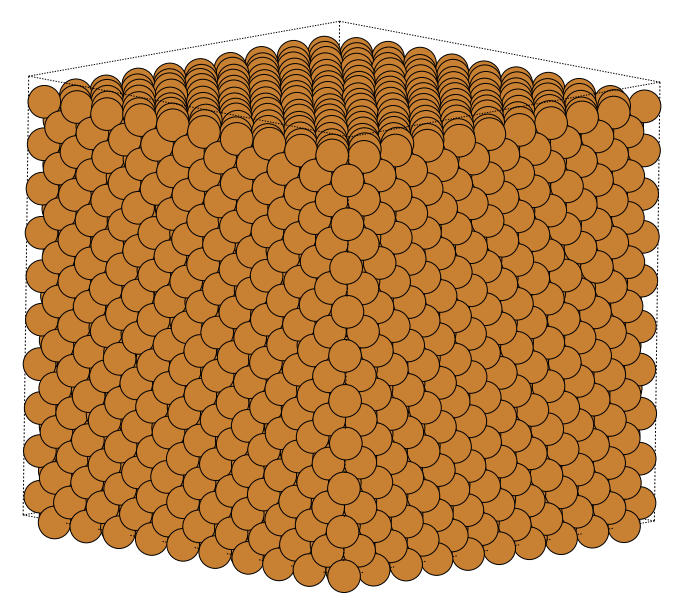

In [44]:
ase.io.write(os.path.join(videos_dir, "Cu_crystal_EMT_langevin.mp4"),
             traj,
             interval=5,
             rotation=("-75x, 45y, 10z"))

In [ ]:
"""Demonstrates molecular dynamics with constant temperature."""
from __future__ import print_function

from ase.lattice.cubic import FaceCenteredCubic
from ase.md.langevin import Langevin
from ase.io.trajectory import Trajectory
from ase import units

from asap3 import EMT  # Way too slow with ase.EMT !
size = 10

T = 1500  # Kelvin

# Set up a crystal
atoms = FaceCenteredCubic(directions=[[1, 0, 0], [0, 1, 0], [0, 0, 1]],
                          symbol="Cu",
                          size=(size, size, size),
                          pbc=False)

# Describe the interatomic interactions with the Effective Medium Theory
atoms.set_calculator(EMT())

# We want to run MD with constant energy using the Langevin algorithm
# with a time step of 5 fs, the temperature T and the friction
# coefficient to 0.02 atomic units.
dyn = Langevin(atoms, 5 * units.fs, T * units.kB, 0.002)


def printenergy(a=atoms):  # store a reference to atoms in the definition.
    """Function to print the potential, kinetic and total energy."""
    epot = a.get_potential_energy() / len(a)
    ekin = a.get_kinetic_energy() / len(a)
    print('Energy per atom: Epot = %.3feV  Ekin = %.3feV (T=%3.0fK)  '
          'Etot = %.3feV' % (epot, ekin, ekin / (1.5 * units.kB), epot + ekin))
    
dyn.attach(printenergy, interval=50)

# We also want to save the positions of all atoms after every 100th time step.
traj = Trajectory('data/Cu_1500K_EMT_langevin.traj', 'w', atoms)
dyn.attach(traj.write, interval=50)

# Now run the dynamics
printenergy()
dyn.run(5000)

Energy per atom: Epot = 0.135eV  Ekin = 0.000eV (T=  0K)  Etot = 0.135eV
Energy per atom: Epot = 0.135eV  Ekin = 0.000eV (T=  0K)  Etot = 0.135eV
Energy per atom: Epot = 0.142eV  Ekin = 0.011eV (T= 86K)  Etot = 0.153eV
Energy per atom: Epot = 0.152eV  Ekin = 0.019eV (T=150K)  Etot = 0.171eV
Energy per atom: Epot = 0.160eV  Ekin = 0.028eV (T=214K)  Etot = 0.188eV
Energy per atom: Epot = 0.168eV  Ekin = 0.036eV (T=277K)  Etot = 0.204eV
Energy per atom: Epot = 0.178eV  Ekin = 0.042eV (T=322K)  Etot = 0.219eV
Energy per atom: Epot = 0.186eV  Ekin = 0.048eV (T=374K)  Etot = 0.234eV
Energy per atom: Epot = 0.191eV  Ekin = 0.057eV (T=442K)  Etot = 0.248eV
Energy per atom: Epot = 0.198eV  Ekin = 0.063eV (T=488K)  Etot = 0.261eV
Energy per atom: Epot = 0.205eV  Ekin = 0.067eV (T=520K)  Etot = 0.273eV
Energy per atom: Epot = 0.211eV  Ekin = 0.073eV (T=566K)  Etot = 0.284eV
Energy per atom: Epot = 0.220eV  Ekin = 0.077eV (T=595K)  Etot = 0.297eV
Energy per atom: Epot = 0.224eV  Ekin = 0.083eV (T=

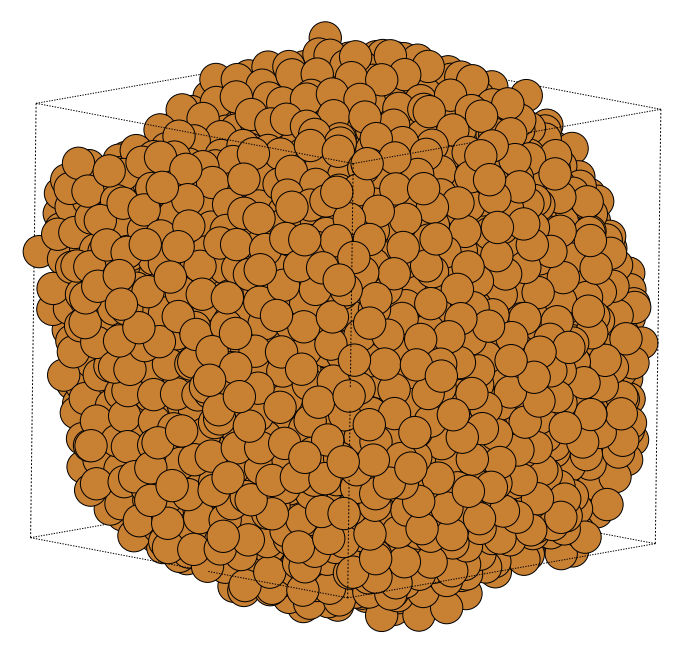

In [50]:
traj = Trajectory("data/Cu_1500K_EMT_langevin.traj")
ase.io.write(os.path.join(videos_dir, "Cu_1500K_EMT_langevin.traj.mp4"),
             traj,
             interval=5,
             rotation=("-75x, 45y, 10z"))

### Isolated particle MD

Zero linear momentum, zero angular momentum

In [55]:
identifier = "Cu_isolated_md_zero_lm_zero_am.traj"

In [56]:
from __future__ import print_function

from ase.cluster.cubic import FaceCenteredCubic
from ase.optimize import QuasiNewton
from ase.md.velocitydistribution import (MaxwellBoltzmannDistribution,
                                         Stationary, ZeroRotation)
from ase.md.verlet import VelocityVerlet
from ase import units

# Use Asap for a huge performance increase if it is installed
use_asap = True

if use_asap:
    from asap3 import EMT
    size = 4
else:
    from ase.calculators.emt import EMT
    size = 2

# Set up a nanoparticle
atoms = FaceCenteredCubic('Cu',
                          surfaces=[[1, 0, 0], [1, 1, 0], [1, 1, 1]],
                          layers=(size, size, size),
                          vacuum=4)

# Describe the interatomic interactions with the Effective Medium Theory
atoms.set_calculator(EMT())

# Do a quick relaxation of the cluster
qn = QuasiNewton(atoms)
qn.run(0.001, 10)

# Set the momenta corresponding to T=1200K
MaxwellBoltzmannDistribution(atoms, 1200 * units.kB)
Stationary(atoms)  # zero linear momentum
ZeroRotation(atoms)  # zero angular momentum

# We want to run MD using the VelocityVerlet algorithm.

# Save trajectory:
dyn = VelocityVerlet(atoms, 5 * units.fs, trajectory="data/%s" % identifier)


def printenergy(a=atoms):  # store a reference to atoms in the definition.
    """Function to print the potential, kinetic and total energy."""
    epot = a.get_potential_energy() / len(a)
    ekin = a.get_kinetic_energy() / len(a)
    print('Energy per atom: Epot = %.3feV  Ekin = %.3feV (T=%3.0fK)  '
          'Etot = %.3feV' % (epot, ekin, ekin / (1.5 * units.kB), epot + ekin))

dyn.attach(printenergy, interval=10)

# Now run the dynamics
printenergy()
dyn.run(2000)

                Step[ FC]     Time          Energy          fmax
*Force-consistent energies used in optimization.
BFGSLineSearch:    0[  0] 18:29:20       43.457006*       1.0818
BFGSLineSearch:    1[  1] 18:29:20       42.347659*       0.2273
BFGSLineSearch:    2[  2] 18:29:20       42.108454*       0.1349
BFGSLineSearch:    3[  3] 18:29:20       41.964817*       0.1138
BFGSLineSearch:    4[  4] 18:29:20       41.924933*       0.0683
BFGSLineSearch:    5[  5] 18:29:20       41.915346*       0.0225
BFGSLineSearch:    6[  6] 18:29:20       41.914920*       0.0059
BFGSLineSearch:    7[  7] 18:29:20       41.914872*       0.0023
BFGSLineSearch:    8[  9] 18:29:20       41.914855*       0.0023
BFGSLineSearch:    9[ 10] 18:29:20       41.914851*       0.0010
Energy per atom: Epot = 0.451eV  Ekin = 0.183eV (T=1418K)  Etot = 0.634eV
Energy per atom: Epot = 0.451eV  Ekin = 0.183eV (T=1418K)  Etot = 0.634eV
Energy per atom: Epot = 0.558eV  Ekin = 0.076eV (T=589K)  Etot = 0.635eV
Energy per atom

Energy per atom: Epot = 0.546eV  Ekin = 0.088eV (T=682K)  Etot = 0.635eV
Energy per atom: Epot = 0.544eV  Ekin = 0.091eV (T=702K)  Etot = 0.635eV
Energy per atom: Epot = 0.532eV  Ekin = 0.102eV (T=791K)  Etot = 0.635eV
Energy per atom: Epot = 0.550eV  Ekin = 0.084eV (T=651K)  Etot = 0.635eV
Energy per atom: Epot = 0.547eV  Ekin = 0.088eV (T=681K)  Etot = 0.635eV
Energy per atom: Epot = 0.550eV  Ekin = 0.085eV (T=654K)  Etot = 0.635eV
Energy per atom: Epot = 0.540eV  Ekin = 0.094eV (T=730K)  Etot = 0.635eV
Energy per atom: Epot = 0.550eV  Ekin = 0.085eV (T=657K)  Etot = 0.635eV
Energy per atom: Epot = 0.541eV  Ekin = 0.093eV (T=722K)  Etot = 0.635eV
Energy per atom: Epot = 0.548eV  Ekin = 0.087eV (T=672K)  Etot = 0.635eV
Energy per atom: Epot = 0.547eV  Ekin = 0.088eV (T=678K)  Etot = 0.635eV
Energy per atom: Epot = 0.550eV  Ekin = 0.085eV (T=658K)  Etot = 0.635eV
Energy per atom: Epot = 0.550eV  Ekin = 0.084eV (T=652K)  Etot = 0.635eV
Energy per atom: Epot = 0.555eV  Ekin = 0.079eV (T=

True

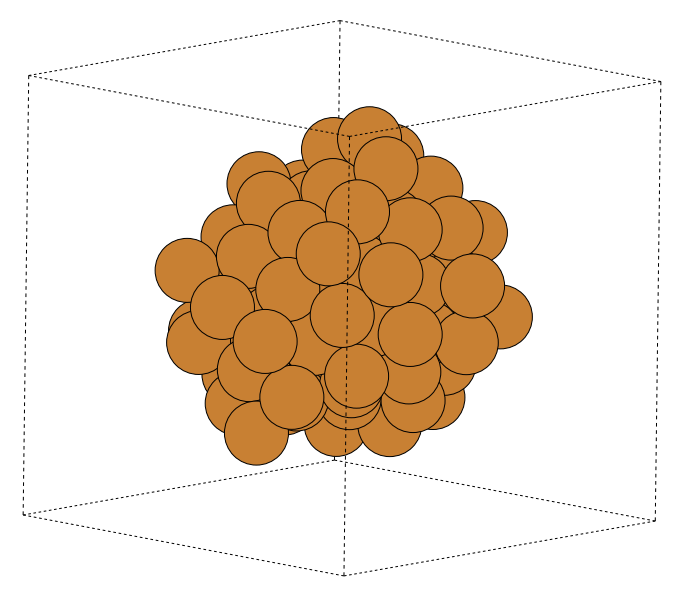

In [57]:
traj = Trajectory("data/%s" % identifier)
ase.io.write(os.path.join(videos_dir, identifier + ".mp4"),
             [traj[i] for i in range(0, len(traj), 10)],
             interval=5,
             rotation=("-75x, 45y, 10z"))

Zero linear momentum

In [58]:
identifier = "Cu_isolated_md_zero_lm.traj"

In [59]:
from __future__ import print_function

from ase.cluster.cubic import FaceCenteredCubic
from ase.optimize import QuasiNewton
from ase.md.velocitydistribution import (MaxwellBoltzmannDistribution,
                                         Stationary, ZeroRotation)
from ase.md.verlet import VelocityVerlet
from ase import units

# Use Asap for a huge performance increase if it is installed
use_asap = True

if use_asap:
    from asap3 import EMT
    size = 4
else:
    from ase.calculators.emt import EMT
    size = 2

# Set up a nanoparticle
atoms = FaceCenteredCubic('Cu',
                          surfaces=[[1, 0, 0], [1, 1, 0], [1, 1, 1]],
                          layers=(size, size, size),
                          vacuum=4)

# Describe the interatomic interactions with the Effective Medium Theory
atoms.set_calculator(EMT())

# Do a quick relaxation of the cluster
qn = QuasiNewton(atoms)
qn.run(0.001, 10)

# Set the momenta corresponding to T=1200K
MaxwellBoltzmannDistribution(atoms, 1200 * units.kB)
Stationary(atoms)  # zero linear momentum
# ZeroRotation(atoms)  # zero angular momentum

# We want to run MD using the VelocityVerlet algorithm.

# Save trajectory:
dyn = VelocityVerlet(atoms, 5 * units.fs, trajectory="data/%s" % identifier)


def printenergy(a=atoms):  # store a reference to atoms in the definition.
    """Function to print the potential, kinetic and total energy."""
    epot = a.get_potential_energy() / len(a)
    ekin = a.get_kinetic_energy() / len(a)
    print('Energy per atom: Epot = %.3feV  Ekin = %.3feV (T=%3.0fK)  '
          'Etot = %.3feV' % (epot, ekin, ekin / (1.5 * units.kB), epot + ekin))

dyn.attach(printenergy, interval=10)

# Now run the dynamics
printenergy()
dyn.run(2000)

                Step[ FC]     Time          Energy          fmax
*Force-consistent energies used in optimization.
BFGSLineSearch:    0[  0] 18:31:30       43.457006*       1.0818
BFGSLineSearch:    1[  1] 18:31:30       42.347659*       0.2273
BFGSLineSearch:    2[  2] 18:31:30       42.108454*       0.1349
BFGSLineSearch:    3[  3] 18:31:30       41.964817*       0.1138
BFGSLineSearch:    4[  4] 18:31:30       41.924933*       0.0683
BFGSLineSearch:    5[  5] 18:31:30       41.915346*       0.0225
BFGSLineSearch:    6[  6] 18:31:30       41.914920*       0.0059
BFGSLineSearch:    7[  7] 18:31:30       41.914872*       0.0023
BFGSLineSearch:    8[  9] 18:31:30       41.914855*       0.0023
BFGSLineSearch:    9[ 10] 18:31:30       41.914851*       0.0010
Energy per atom: Epot = 0.451eV  Ekin = 0.138eV (T=1066K)  Etot = 0.588eV
Energy per atom: Epot = 0.451eV  Ekin = 0.138eV (T=1066K)  Etot = 0.588eV
Energy per atom: Epot = 0.534eV  Ekin = 0.055eV (T=427K)  Etot = 0.589eV
Energy per atom

Energy per atom: Epot = 0.527eV  Ekin = 0.062eV (T=483K)  Etot = 0.589eV
Energy per atom: Epot = 0.524eV  Ekin = 0.065eV (T=506K)  Etot = 0.589eV
Energy per atom: Epot = 0.529eV  Ekin = 0.060eV (T=467K)  Etot = 0.589eV
Energy per atom: Epot = 0.523eV  Ekin = 0.066eV (T=507K)  Etot = 0.589eV
Energy per atom: Epot = 0.524eV  Ekin = 0.065eV (T=500K)  Etot = 0.589eV
Energy per atom: Epot = 0.523eV  Ekin = 0.066eV (T=513K)  Etot = 0.589eV
Energy per atom: Epot = 0.520eV  Ekin = 0.069eV (T=532K)  Etot = 0.589eV
Energy per atom: Epot = 0.526eV  Ekin = 0.063eV (T=490K)  Etot = 0.589eV
Energy per atom: Epot = 0.521eV  Ekin = 0.068eV (T=523K)  Etot = 0.589eV
Energy per atom: Epot = 0.527eV  Ekin = 0.062eV (T=482K)  Etot = 0.589eV
Energy per atom: Epot = 0.521eV  Ekin = 0.068eV (T=525K)  Etot = 0.589eV
Energy per atom: Epot = 0.515eV  Ekin = 0.074eV (T=572K)  Etot = 0.589eV
Energy per atom: Epot = 0.530eV  Ekin = 0.059eV (T=460K)  Etot = 0.589eV
Energy per atom: Epot = 0.528eV  Ekin = 0.061eV (T=

True

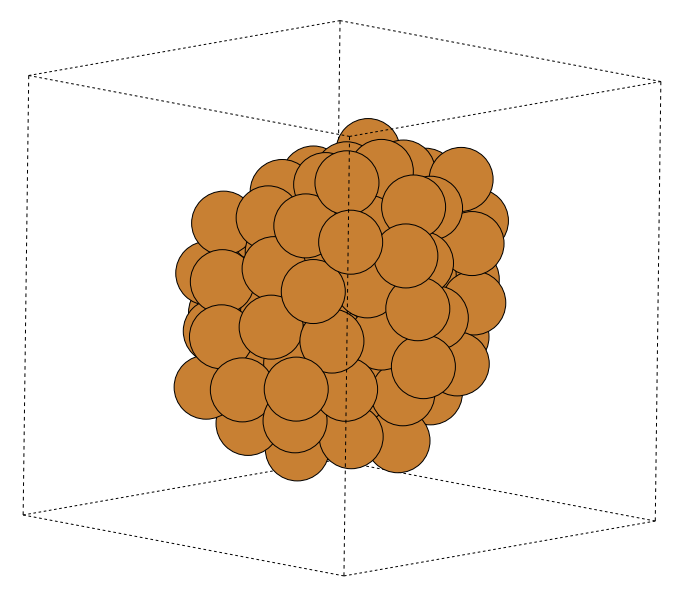

In [60]:
traj = Trajectory("data/%s" % identifier)
ase.io.write(os.path.join(videos_dir, identifier + ".mp4"),
             [traj[i] for i in range(0, len(traj), 10)],
             interval=5,
             rotation=("-75x, 45y, 10z"))

Zero angular momentum

In [61]:
identifier = "Cu_isolated_md_zero_am.traj"

In [62]:
from __future__ import print_function

from ase.cluster.cubic import FaceCenteredCubic
from ase.optimize import QuasiNewton
from ase.md.velocitydistribution import (MaxwellBoltzmannDistribution,
                                         Stationary, ZeroRotation)
from ase.md.verlet import VelocityVerlet
from ase import units

# Use Asap for a huge performance increase if it is installed
use_asap = True

if use_asap:
    from asap3 import EMT
    size = 4
else:
    from ase.calculators.emt import EMT
    size = 2

# Set up a nanoparticle
atoms = FaceCenteredCubic('Cu',
                          surfaces=[[1, 0, 0], [1, 1, 0], [1, 1, 1]],
                          layers=(size, size, size),
                          vacuum=4)

# Describe the interatomic interactions with the Effective Medium Theory
atoms.set_calculator(EMT())

# Do a quick relaxation of the cluster
qn = QuasiNewton(atoms)
qn.run(0.001, 10)

# Set the momenta corresponding to T=1200K
MaxwellBoltzmannDistribution(atoms, 1200 * units.kB)
# Stationary(atoms)  # zero linear momentum
ZeroRotation(atoms)  # zero angular momentum

# We want to run MD using the VelocityVerlet algorithm.

# Save trajectory:
dyn = VelocityVerlet(atoms, 5 * units.fs, trajectory="data/%s" % identifier)


def printenergy(a=atoms):  # store a reference to atoms in the definition.
    """Function to print the potential, kinetic and total energy."""
    epot = a.get_potential_energy() / len(a)
    ekin = a.get_kinetic_energy() / len(a)
    print('Energy per atom: Epot = %.3feV  Ekin = %.3feV (T=%3.0fK)  '
          'Etot = %.3feV' % (epot, ekin, ekin / (1.5 * units.kB), epot + ekin))

dyn.attach(printenergy, interval=10)

# Now run the dynamics
printenergy()
dyn.run(2000)

                Step[ FC]     Time          Energy          fmax
*Force-consistent energies used in optimization.
BFGSLineSearch:    0[  0] 18:33:40       43.457006*       1.0818
BFGSLineSearch:    1[  1] 18:33:40       42.347659*       0.2273
BFGSLineSearch:    2[  2] 18:33:40       42.108454*       0.1349
BFGSLineSearch:    3[  3] 18:33:40       41.964817*       0.1138
BFGSLineSearch:    4[  4] 18:33:40       41.924933*       0.0683
BFGSLineSearch:    5[  5] 18:33:40       41.915346*       0.0225
BFGSLineSearch:    6[  6] 18:33:40       41.914920*       0.0059
BFGSLineSearch:    7[  7] 18:33:40       41.914872*       0.0023
BFGSLineSearch:    8[  9] 18:33:40       41.914855*       0.0023
BFGSLineSearch:    9[ 10] 18:33:40       41.914851*       0.0010
Energy per atom: Epot = 0.451eV  Ekin = 0.142eV (T=1100K)  Etot = 0.593eV
Energy per atom: Epot = 0.451eV  Ekin = 0.142eV (T=1100K)  Etot = 0.593eV
Energy per atom: Epot = 0.531eV  Ekin = 0.063eV (T=484K)  Etot = 0.593eV
Energy per atom

Energy per atom: Epot = 0.533eV  Ekin = 0.060eV (T=464K)  Etot = 0.593eV
Energy per atom: Epot = 0.525eV  Ekin = 0.068eV (T=526K)  Etot = 0.593eV
Energy per atom: Epot = 0.520eV  Ekin = 0.073eV (T=567K)  Etot = 0.593eV
Energy per atom: Epot = 0.524eV  Ekin = 0.069eV (T=536K)  Etot = 0.593eV
Energy per atom: Epot = 0.522eV  Ekin = 0.071eV (T=548K)  Etot = 0.593eV
Energy per atom: Epot = 0.521eV  Ekin = 0.072eV (T=559K)  Etot = 0.593eV
Energy per atom: Epot = 0.529eV  Ekin = 0.065eV (T=500K)  Etot = 0.593eV
Energy per atom: Epot = 0.524eV  Ekin = 0.069eV (T=537K)  Etot = 0.593eV
Energy per atom: Epot = 0.519eV  Ekin = 0.074eV (T=574K)  Etot = 0.593eV
Energy per atom: Epot = 0.530eV  Ekin = 0.064eV (T=493K)  Etot = 0.593eV
Energy per atom: Epot = 0.523eV  Ekin = 0.070eV (T=543K)  Etot = 0.593eV
Energy per atom: Epot = 0.523eV  Ekin = 0.071eV (T=546K)  Etot = 0.593eV
Energy per atom: Epot = 0.532eV  Ekin = 0.061eV (T=472K)  Etot = 0.593eV
Energy per atom: Epot = 0.524eV  Ekin = 0.069eV (T=

True

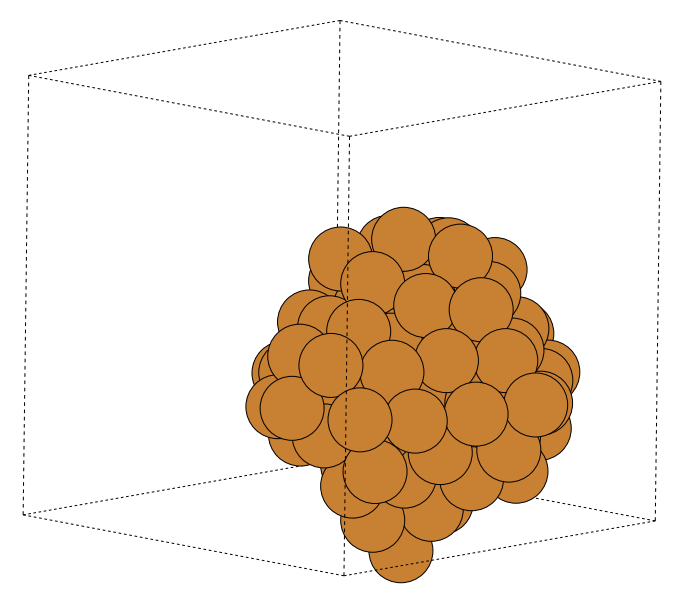

In [63]:
traj = Trajectory("data/%s" % identifier)
ase.io.write(os.path.join(videos_dir, identifier + ".mp4"),
             [traj[i] for i in range(0, len(traj), 10)],
             interval=5,
             rotation=("-75x, 45y, 10z"))

Zero nothing

In [64]:
identifier = "Cu_isolated_md.traj"

In [65]:
from __future__ import print_function

from ase.cluster.cubic import FaceCenteredCubic
from ase.optimize import QuasiNewton
from ase.md.velocitydistribution import (MaxwellBoltzmannDistribution,
                                         Stationary, ZeroRotation)
from ase.md.verlet import VelocityVerlet
from ase import units

# Use Asap for a huge performance increase if it is installed
use_asap = True

if use_asap:
    from asap3 import EMT
    size = 4
else:
    from ase.calculators.emt import EMT
    size = 2

# Set up a nanoparticle
atoms = FaceCenteredCubic('Cu',
                          surfaces=[[1, 0, 0], [1, 1, 0], [1, 1, 1]],
                          layers=(size, size, size),
                          vacuum=4)

# Describe the interatomic interactions with the Effective Medium Theory
atoms.set_calculator(EMT())

# Do a quick relaxation of the cluster
qn = QuasiNewton(atoms)
qn.run(0.001, 10)

# Set the momenta corresponding to T=1200K
MaxwellBoltzmannDistribution(atoms, 1200 * units.kB)
# Stationary(atoms)  # zero linear momentum
# ZeroRotation(atoms)  # zero angular momentum

# We want to run MD using the VelocityVerlet algorithm.

# Save trajectory:
dyn = VelocityVerlet(atoms, 5 * units.fs, trajectory="data/%s" % identifier)


def printenergy(a=atoms):  # store a reference to atoms in the definition.
    """Function to print the potential, kinetic and total energy."""
    epot = a.get_potential_energy() / len(a)
    ekin = a.get_kinetic_energy() / len(a)
    print('Energy per atom: Epot = %.3feV  Ekin = %.3feV (T=%3.0fK)  '
          'Etot = %.3feV' % (epot, ekin, ekin / (1.5 * units.kB), epot + ekin))

dyn.attach(printenergy, interval=10)

# Now run the dynamics
printenergy()
dyn.run(2000)

                Step[ FC]     Time          Energy          fmax
*Force-consistent energies used in optimization.
BFGSLineSearch:    0[  0] 18:35:50       43.457006*       1.0818
BFGSLineSearch:    1[  1] 18:35:50       42.347659*       0.2273
BFGSLineSearch:    2[  2] 18:35:50       42.108454*       0.1349
BFGSLineSearch:    3[  3] 18:35:50       41.964817*       0.1138
BFGSLineSearch:    4[  4] 18:35:50       41.924933*       0.0683
BFGSLineSearch:    5[  5] 18:35:50       41.915346*       0.0225
BFGSLineSearch:    6[  6] 18:35:51       41.914920*       0.0059
BFGSLineSearch:    7[  7] 18:35:51       41.914872*       0.0023
BFGSLineSearch:    8[  9] 18:35:51       41.914855*       0.0023
BFGSLineSearch:    9[ 10] 18:35:51       41.914851*       0.0010
Energy per atom: Epot = 0.451eV  Ekin = 0.151eV (T=1169K)  Etot = 0.602eV
Energy per atom: Epot = 0.451eV  Ekin = 0.151eV (T=1169K)  Etot = 0.602eV
Energy per atom: Epot = 0.535eV  Ekin = 0.067eV (T=522K)  Etot = 0.602eV
Energy per atom

Energy per atom: Epot = 0.528eV  Ekin = 0.074eV (T=572K)  Etot = 0.602eV
Energy per atom: Epot = 0.529eV  Ekin = 0.073eV (T=564K)  Etot = 0.602eV
Energy per atom: Epot = 0.534eV  Ekin = 0.069eV (T=531K)  Etot = 0.602eV
Energy per atom: Epot = 0.525eV  Ekin = 0.077eV (T=596K)  Etot = 0.602eV
Energy per atom: Epot = 0.528eV  Ekin = 0.075eV (T=577K)  Etot = 0.602eV
Energy per atom: Epot = 0.534eV  Ekin = 0.069eV (T=532K)  Etot = 0.602eV
Energy per atom: Epot = 0.524eV  Ekin = 0.078eV (T=605K)  Etot = 0.602eV
Energy per atom: Epot = 0.522eV  Ekin = 0.081eV (T=623K)  Etot = 0.602eV
Energy per atom: Epot = 0.525eV  Ekin = 0.078eV (T=600K)  Etot = 0.602eV
Energy per atom: Epot = 0.531eV  Ekin = 0.071eV (T=548K)  Etot = 0.602eV
Energy per atom: Epot = 0.521eV  Ekin = 0.081eV (T=629K)  Etot = 0.602eV
Energy per atom: Epot = 0.526eV  Ekin = 0.076eV (T=587K)  Etot = 0.602eV
Energy per atom: Epot = 0.529eV  Ekin = 0.073eV (T=569K)  Etot = 0.602eV
Energy per atom: Epot = 0.540eV  Ekin = 0.063eV (T=

True

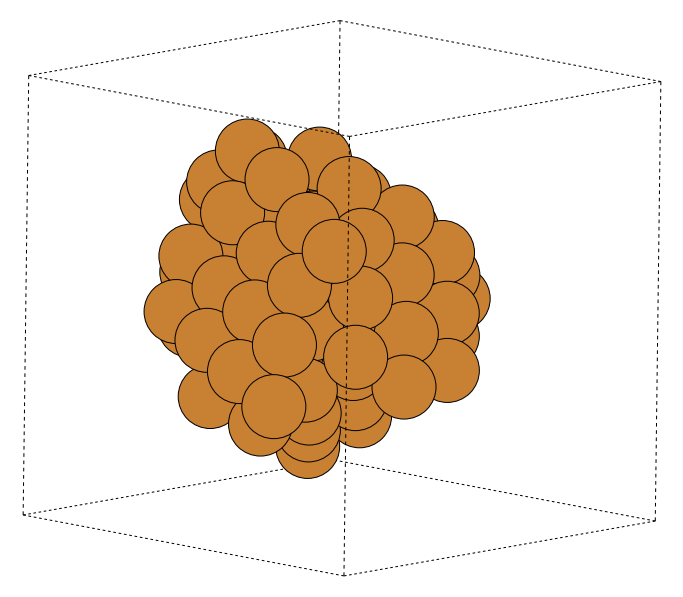

In [66]:
traj = Trajectory("data/%s" % identifier)
ase.io.write(os.path.join(videos_dir, identifier + ".mp4"),
             [traj[i] for i in range(0, len(traj), 10)],
             interval=5,
             rotation=("-75x, 45y, 10z"))

## MD on the ISO 17 dataset

Downloaded from [quantum-machine.org/datasets](http://quantum-machine.org/datasets/).

Let's try visualizing some of these trajectories.

In [131]:
from ase.db import connect

# reference.db has 101 molecules (out of 129 total) and 3999 conformational steps (out or 5000 total) for each.
# path_to_db = "/Users/abhshkdz/projects/electrocatalysis/baselines/data/data/iso17/reference.db"

# test_within.db has 101 molecules (out of 129 total; same as training) and final 1000 conformational steps for each.
path_to_db = "/Users/abhshkdz/projects/electrocatalysis/baselines/data/data/iso17/test_within.db"

conn = connect(path_to_db)
data = conn.select()

# # traj = []

# # for i in range(len(data)):
# #     traj.append(data[i].toatoms())
# for i in data:
#     print(i)
#     break

In [132]:
# Check if the boundaires 

dataset2 = []
for i in data:
    dataset2.append(i)

# print(i.data['atomic_forces'])
# print(i.toatoms().get_forces())

# print(dataset[0])

In [136]:
print(len(dataset))
print(len(dataset2))

print(dataset2[0].toatoms().numbers)
print(dataset2[998].toatoms().numbers)
print(dataset2[999].toatoms().numbers)
print(dataset2[1000].toatoms().numbers)
print(dataset2[1001].toatoms().numbers)

404000
101000
[8 6 6 6 8 6 6 6 6 1 1 1 1 1 1 1 1 1 1]
[8 6 6 6 8 6 6 6 6 1 1 1 1 1 1 1 1 1 1]
[8 6 6 6 8 6 6 6 6 1 1 1 1 1 1 1 1 1 1]
[6 6 6 6 6 8 6 6 8 1 1 1 1 1 1 1 1 1 1]
[6 6 6 6 6 8 6 6 8 1 1 1 1 1 1 1 1 1 1]


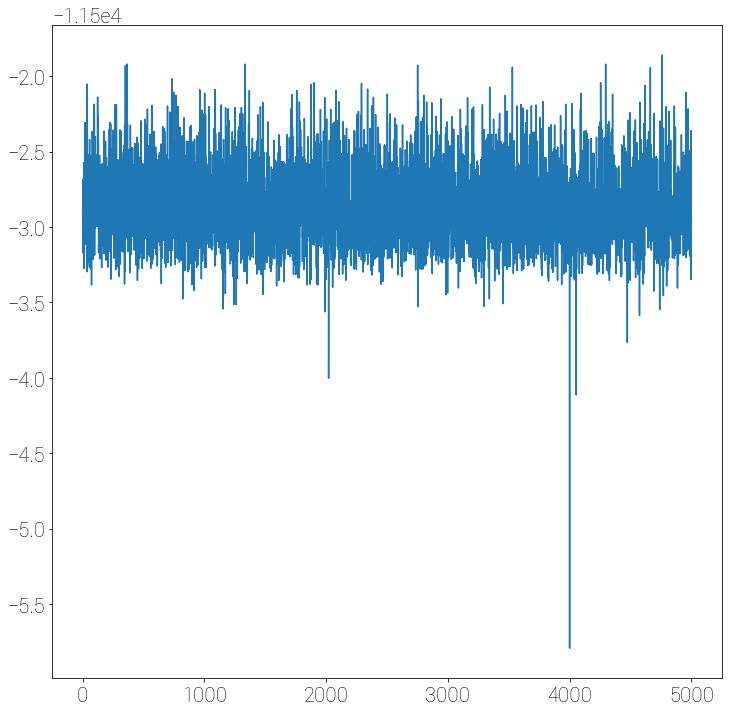

In [154]:
# energies = []

# idx = 100
# sample_len = 3999
# sampling_resolution = 5

# for _ in range(idx * sample_len, (idx+1) * sample_len, sampling_resolution):
#     energies.append(dataset[_]['total_energy'])

# sns.lineplot(x=list(range(math.ceil(sample_len / sampling_resolution))), y=energies)

energies = []

idx = 20
sample_len_d1 = 4000
sample_len_d2 = 1000
sampling_resolution = 1

for _ in range(idx * sample_len_d1, (idx+1) * sample_len_d1, sampling_resolution):
    energies.append(dataset[_]['total_energy'])

for _ in range(idx * sample_len_d2, (idx+1) * sample_len_d2, sampling_resolution):
    energies.append(dataset2[_]['total_energy'])

sns.lineplot(x=list(range(math.ceil((sample_len_d1 + sample_len_d2) / sampling_resolution))), y=energies)

In [171]:
# dataset2[999].data['atomic_forces']

# # print(len(traj))
# # print(traj[0].numbers)
# # print(traj[3000].numbers)
# # print(traj[3998].numbers)
# # print(traj[3999].numbers)
# # print(traj[4000].numbers)
# # print(traj[4999].numbers)

# # all(traj[3998].numbers == traj[3999].numbers)
# # print(len(traj))
# # print(dir(traj[0]))
# # print(traj[0].get_potential_energy())

idx = 0
sample_len_d1 = 3999
sample_len_d2 = 1000

traj = [_.toatoms() for _ in dataset[idx * sample_len_d1 : (idx+1) * sample_len_d1]] + \
    [_.toatoms() for _ in dataset2[idx * sample_len_d2 : (idx+1) * sample_len_d2]]

In [172]:
from nglview import show_ase, show_asetraj

trajview = show_asetraj(traj)
trajview

NGLWidget(max_frame=4998)

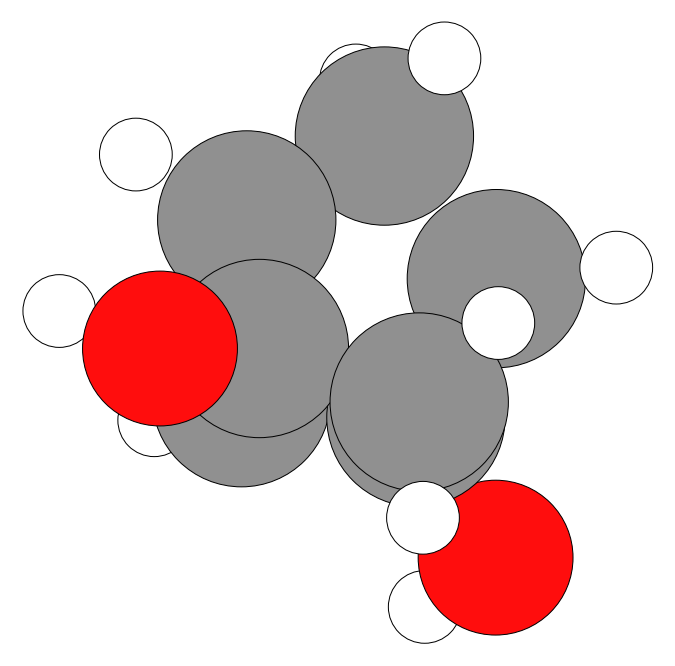

In [186]:
identifier = "iso17_0_5k_steps"

ase.io.write(os.path.join(videos_dir, identifier + ".mp4"),
             [traj[i] for i in range(0, len(traj), 50)],
             interval=5,)
#              rotation=("-75x, 45y, 10z"))

In [185]:
# print(dir(dataset[0]))
# print(dataset[0].data)
print(dataset[0].unique_id)
print(dataset[1].unique_id)
print(dataset[2].unique_id)

# print(dataset[0].toatoms())
# print(dataset[0].toatoms().get_potential_energy())

58daf88b8a2aad1ec2e780dca0433f40
a1e5055b8d207cb472d24cd4b0ea5968
e793d3476f01c7c733fd1dca5cd24ce5


## MD Trajectories of C7O2H10

Downloaded from [quantum-machine.org/datasets/](http://www.quantum-machine.org/datasets/).

Let's try and visualize some trajectories.

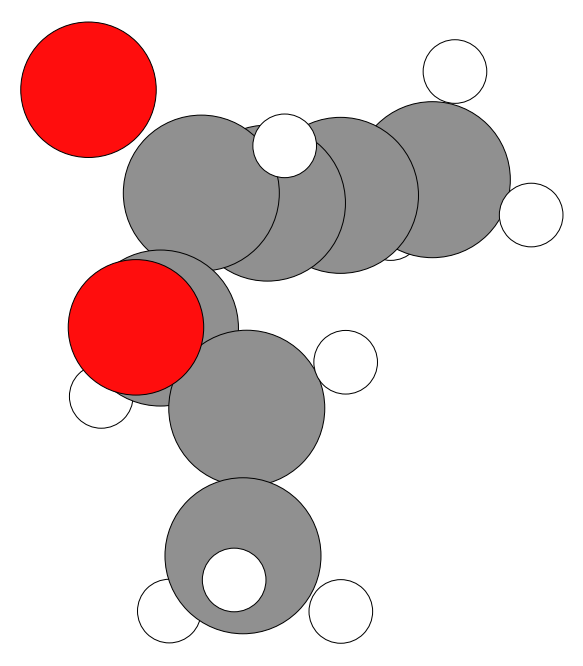

In [225]:
data_root = "/Users/abhshkdz/projects/electrocatalysis/baselines/data/data/c7o2h10/c7o2h10_md"
idx = "1000.xyz"

traj = []
for _ in range(5000):
    atoms = ase.io.read(os.path.join(data_root, idx), index=_)
    traj.append(atoms)

# trajview = show_asetraj(traj)
# trajview

identifier = "c7o2h10_1000.xyz_5k_steps"
ase.io.write(os.path.join(videos_dir, identifier + ".mp4"),
             [traj[i] for i in range(0, len(traj), 50)],
             interval=5,
             rotation=("-75x, 45y, 10z"))

## MD trajectories from Muhammed

In [247]:
data_root = "/Users/abhshkdz/projects/electrocatalysis/baselines/data/data/2020_04_14_muhammed_md"

identifier = "COCu_DFT_10ps.traj"
traj = Trajectory(os.path.join(data_root, identifier))

print(len(traj))

################################################################
# From Muhammed:
#
# apply_constraint = False
#
# because this because if a system has imposed constraints
# (such as fixing a layer of the slab) not setting that argument
# will by default return force = 0 by technicality, but rather
# in actuality it still exhibits those forces just "fixed" to
# prevent movement
################################################################

print(traj[0].get_potential_energy(apply_constraint=False))
print(traj[0].get_forces(apply_constraint=False))
print(traj[0].get_positions())

10000
-92.26874626
[[  0.         0.         0.      ]
 [  0.         0.         0.      ]
 [  0.         0.         0.      ]
 [  0.         0.         0.      ]
 [  0.         0.         0.      ]
 [  0.         0.         0.      ]
 [  0.         0.         0.      ]
 [  0.         0.         0.      ]
 [  0.         0.         0.      ]
 [  0.         0.         0.      ]
 [  0.         0.         0.      ]
 [  0.         0.         0.      ]
 [  0.         0.         0.      ]
 [  0.         0.         0.      ]
 [  0.         0.         0.      ]
 [  0.         0.         0.      ]
 [  0.         0.         0.      ]
 [  0.         0.         0.      ]
 [ -0.134713  -0.134713  -0.227016]
 [ -0.        -0.243969  -0.176502]
 [  0.134713  -0.134713  -0.227016]
 [ -0.243969   0.        -0.176502]
 [ -0.         0.       -25.960988]
 [  0.243969   0.        -0.176502]
 [ -0.134713   0.134713  -0.227016]
 [ -0.         0.243969  -0.176502]
 [  0.134713   0.134713  -0.227016]
 [ -0.   

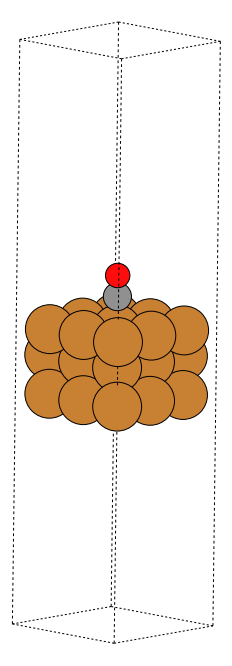

In [248]:
ase.io.write(os.path.join(videos_dir, identifier + ".mp4"),
             [traj[i] for i in range(0, len(traj), 50)],
             interval=5,
             rotation=("-75x, 45y, 10z"))

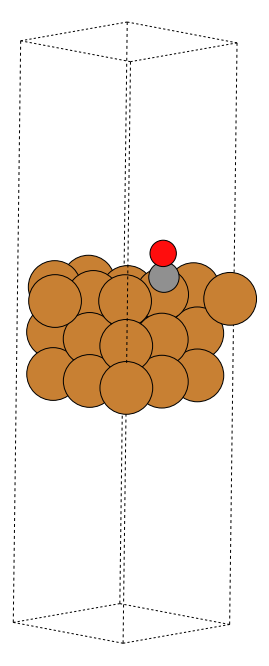

In [249]:
identifier = "COCu_aimd_300K.traj"
traj = Trajectory(os.path.join(data_root, identifier))

ase.io.write(os.path.join(videos_dir, identifier + ".mp4"),
             [traj[i] for i in range(0, len(traj), 50)],
             interval=5,
             rotation=("-75x, 45y, 10z"))

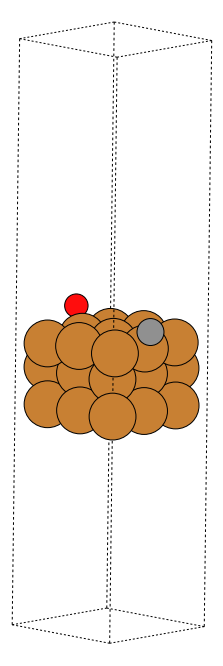

In [250]:
identifier = "COCu_emt_50ps_300K.traj"
traj = Trajectory(os.path.join(data_root, identifier))

ase.io.write(os.path.join(videos_dir, identifier + ".mp4"),
             [traj[i] for i in range(0, len(traj), 50)],
             interval=5,
             rotation=("-75x, 45y, 10z"))

In [7]:
data_root = "/Users/abhshkdz/projects/electrocatalysis/baselines/data/data/2020_04_14_muhammed_md"

identifier = "COCu_DFT_10ps.traj"
traj = Trajectory(os.path.join(data_root, identifier))

energies = [i.get_potential_energy(apply_constraint=False) for i in traj]

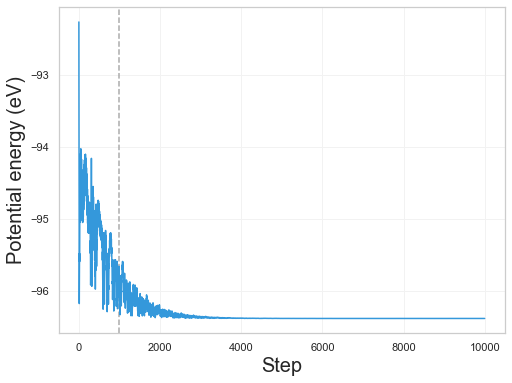

In [291]:
sns.set(style="whitegrid")
flatui = ["#3498db", "#9b59b6", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
sns.set_palette(flatui)

fig, ax = plt.subplots(figsize=(8, 6))

plt.axvline(x=1000, color="#ABABAB", linestyle="--")
sns.lineplot(x=list(range(len(energies))), y=energies, ax=ax)

plt.ylabel("Potential energy (eV)", fontsize=20)
plt.xlabel("Step", fontsize=20)

plt.grid(color="0.95")

# plt.savefig(os.path.join(data_root, identifier+".potential.png"),
#             dpi=150,
#             bbox_inches="tight")

/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3

/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3

/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3

/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3

/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3

/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3

/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3

/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3

/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3

/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/abhshkdz/softwares/anaconda3/envs/cgcnn/lib/python3.6/site-packages/ipykernel_launcher.py:3

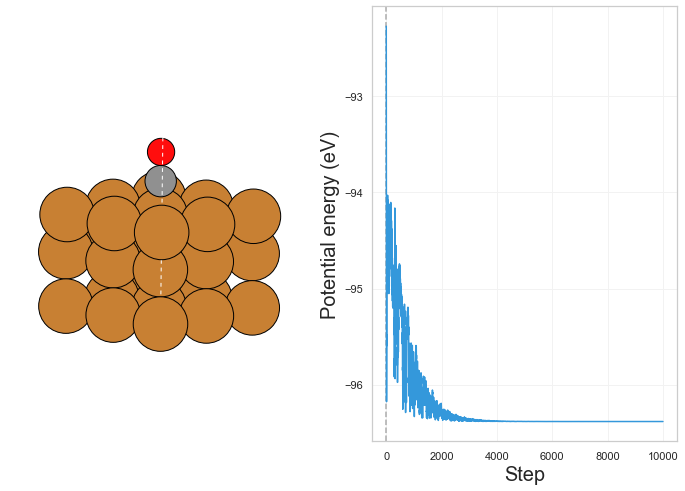

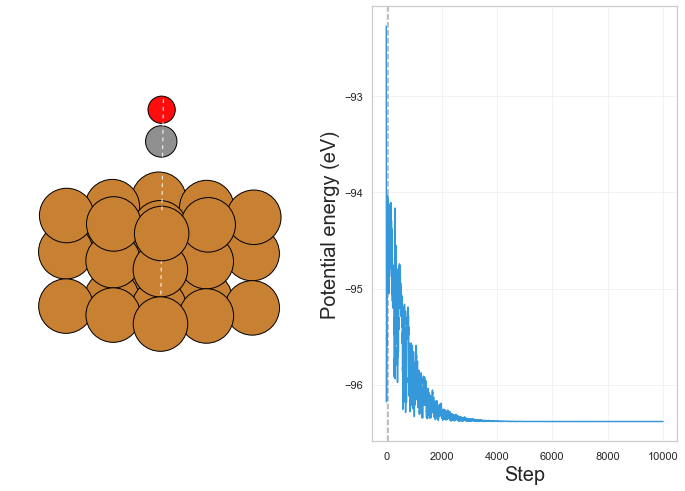

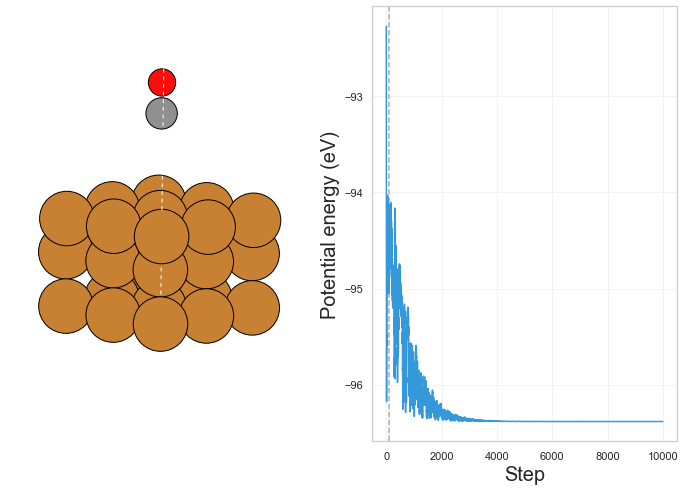

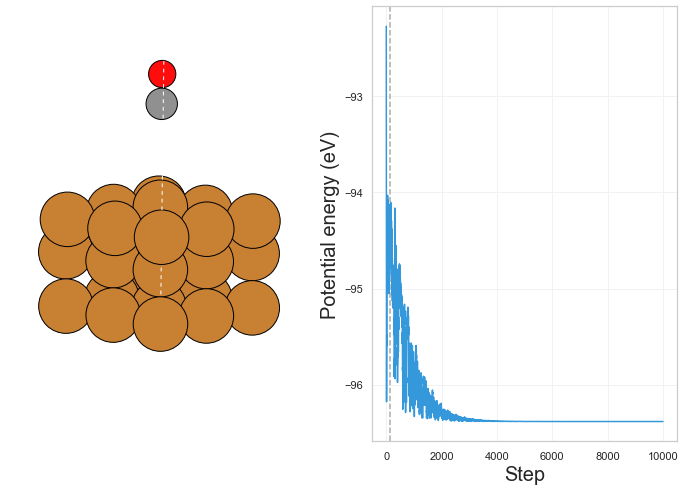

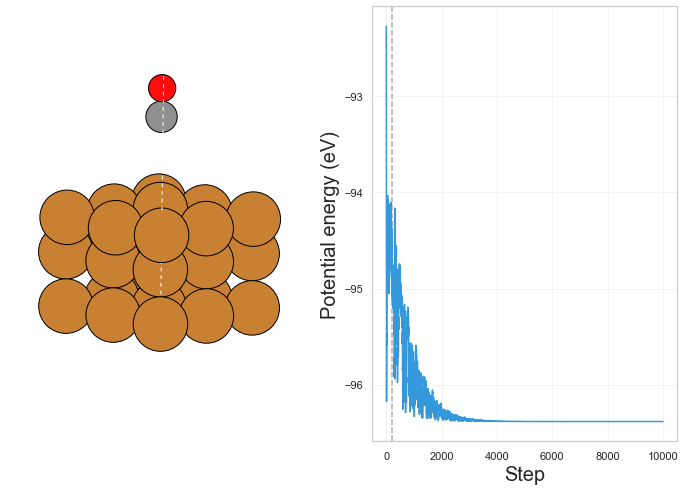

...

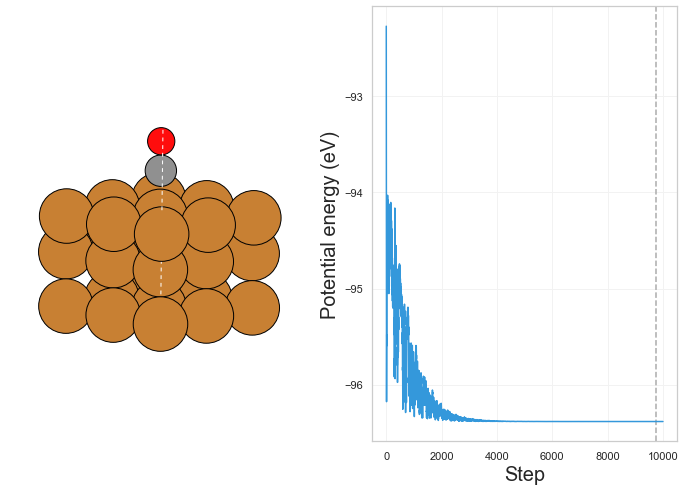

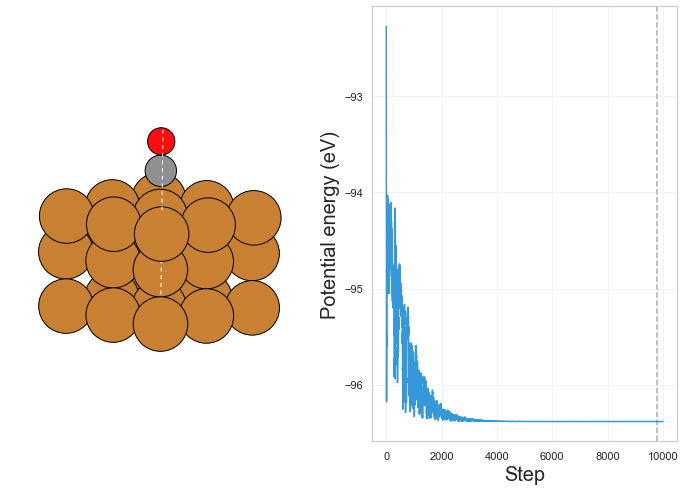

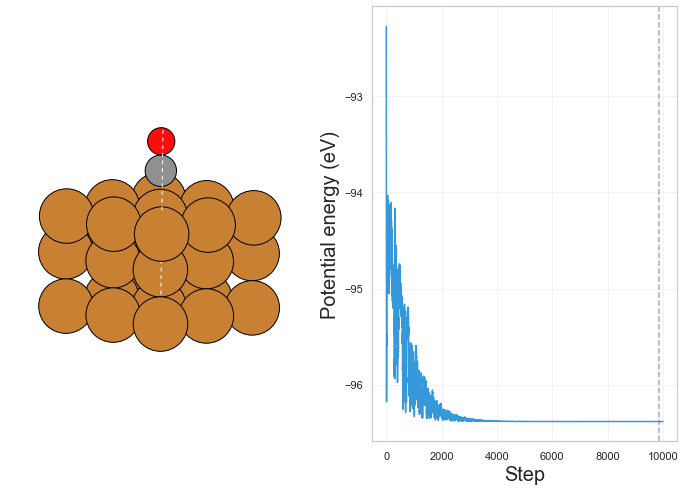

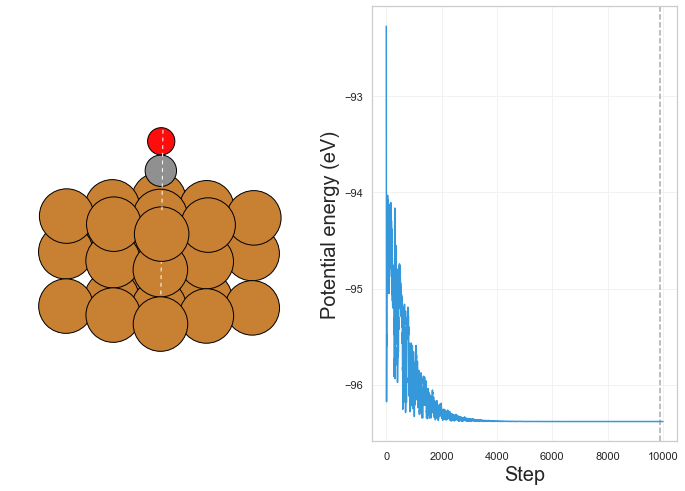

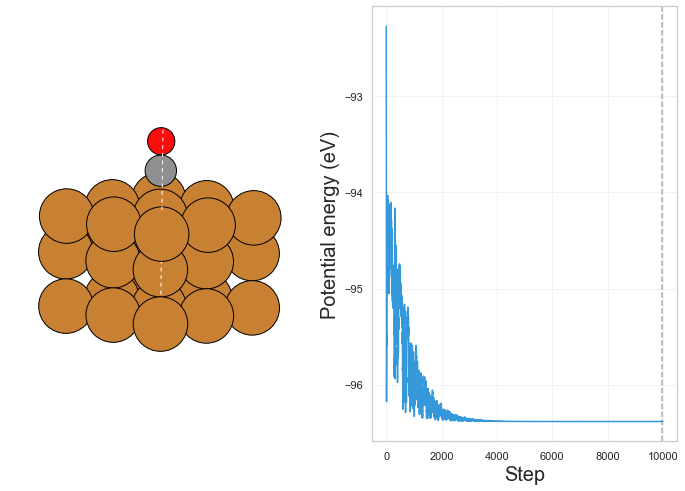

In [350]:
for i in range(0, len(traj), 50):

    fig = plt.figure(figsize=(12, 8))

    plt.subplot(121)
    ax = plt.gca()
    ase.visualize.plot.plot_atoms(traj[i], ax, radii=0.8, rotation=("-75x, 45y, 10z"))
    plt.ylim(10, 25)
    ax.axis("off")

    plt.subplot(122)
    plt.axvline(x=i, color="#ABABAB", linestyle="--")
    sns.lineplot(x=list(range(len(energies))), y=energies)

    plt.ylabel("Potential energy (eV)", fontsize=20)
    plt.xlabel("Step", fontsize=20)
    plt.grid(color="0.95")
    
    plt.savefig(os.path.join(temp_dir, "%s.potential.%012d.png" % (identifier, i)), bbox_inches="tight", dpi=150)

In [352]:
# Create video
import moviepy.editor as mpy

out_name = os.path.join(videos_dir, identifier + ".potential.mp4")
file_list = glob.glob(temp_dir + '/*.png')
file_list.sort()
clip = mpy.ImageSequenceClip(file_list, fps=config["fps"])
clip.write_videofile(out_name, fps=config["fps"])

t:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

Moviepy - Building video videos/COCu_DFT_10ps.trajpotential.mp4.
Moviepy - Writing video videos/COCu_DFT_10ps.trajpotential.mp4



Moviepy - Done !
Moviepy - video ready videos/COCu_DFT_10ps.trajpotential.mp4


## Results from some experiments

Predicting potential energy with position features

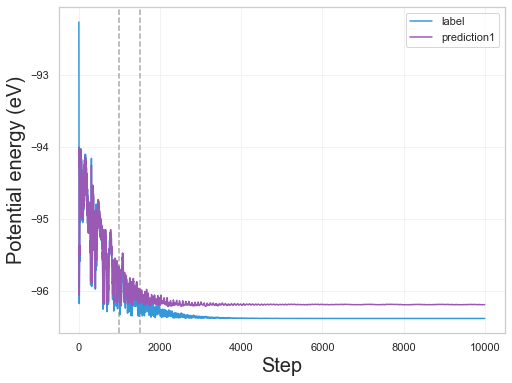

In [18]:
energies_pred = np.load("data/expts/2020-04-17-03-53-35-p_energy_with_positions_1ktrain_seed1/preds.npy")

sns.set(style="whitegrid")
flatui = ["#3498db", "#9b59b6", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
sns.set_palette(flatui)

fig, ax = plt.subplots(figsize=(8, 6))

plt.axvline(x=1000, color="#ABABAB", linestyle="--")
plt.axvline(x=1500, color="#ABABAB", linestyle="--")

sns.lineplot(x=list(range(len(energies))), y=energies, ax=ax, label="label")
sns.lineplot(x=list(range(len(energies_pred))), y=energies_pred, ax=ax, label="prediction1")
# sns.lineplot(x=list(range(len(energies_pred))), y=np.abs(energies_pred - energies), ax=ax)

plt.ylabel("Potential energy (eV)", fontsize=20)
plt.xlabel("Step", fontsize=20)

plt.grid(color="0.95")

# plt.savefig(os.path.join(data_root, identifier+".potential.png"),
#             dpi=150,
#             bbox_inches="tight")